## ANALISANDO DADOS DAS UNIDADES BÁSICAS DE SAÚDE NO BRASIL
___
<br>

#### Murilo Garcia
E-mail: murilogmamaral@gmail.com  
Linkedin: https://www.linkedin.com/in/murilogmamaral/
___

## Bibliotecas

In [1]:
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
pd.options.display.max_rows = 200
sns.set_theme()
plt.style.use('dark_background')
sns.set_palette('PuBu')

## Carregando a base

In [2]:
df = pd.read_csv('http://repositorio.dados.gov.br/saude/unidades-saude/unidade-basica-saude/ubs.csv')

In [3]:
df.columns = [re.sub('dsc_','',x) for x in df.columns]

In [4]:
df.head()

,vlr_latitude,vlr_longitude,cod_munic,cod_cnes,nom_estab,endereco,bairro,cidade,telefone,estrut_fisic_ambiencia,adap_defic_fisic_idosos,equipamentos,medicamentos
0,-10.911237,-37.062078,280030,3492,US OSWALDO DE SOUZA,TV ADALTO BOTELHO,GETULIO VARGAS,Aracaju,7931791326,Desempenho acima da média,Desempenho muito acima da média,Desempenho mediano ou um pouco abaixo da média,Desempenho acima da média
1,-9.485943,-35.857573,270770,6685315,USF ENFERMEIRO PEDRO JACINTO AREA 09,R 15 DE AGOSTO,CENTRO,Rio Largo,Não se aplica,Desempenho mediano ou um pouco abaixo da média,Desempenho mediano ou um pouco abaixo da média,Desempenho mediano ou um pouco abaixo da média,Desempenho mediano ou um pouco abaixo da média
2,-23.896000,-53.410000,411885,6811299,UNIDADE DE ATENCAO PRIMARIA SAUDE DA FAMILIA,RUA GUILHERME BRUXEL,CENTRO,Perobal,4436251462,Desempenho muito acima da média,Desempenho muito acima da média,Desempenho mediano ou um pouco abaixo da média,Desempenho muito acima da média
3,-16.447874,-41.009860,313580,6335616,POSTO DE SAUDE DE BOM JESUS DA ALDEIA,RUA TEOFILO OTONI,ALDEIA,Jequitinhonha,3337411423,Desempenho mediano ou um pouco abaixo da média,Desempenho acima da média,Desempenho mediano ou um pouco abaixo da média,Desempenho mediano ou um pouco abaixo da média
4,-6.573311,-35.107605,250930,6662226,POSTO ANCORA URUBA,RODOVIA PB N 065,SITIO,Mataraca,Não se aplica,Desempenho acima da média,Desempenho acima da média,Desempenho mediano ou um pouco abaixo da média,Desempenho mediano ou um pouco abaixo da média


## Inspecionando a base

In [5]:
# Verificando se há valores nulos
df.isna().sum()

vlr_latitude                 0
vlr_longitude                0
cod_munic                    0
cod_cnes                     0
nom_estab                    0
endereco                     0
bairro                     666
cidade                       0
telefone                     0
estrut_fisic_ambiencia       0
adap_defic_fisic_idosos      0
equipamentos                 0
medicamentos                 0
dtype: int64

In [6]:
# Verificando se há zeros nas colunas
(df==0).sum()

vlr_latitude               0
vlr_longitude              0
cod_munic                  0
cod_cnes                   0
nom_estab                  0
endereco                   0
bairro                     0
cidade                     0
telefone                   0
estrut_fisic_ambiencia     0
adap_defic_fisic_idosos    0
equipamentos               0
medicamentos               0
dtype: int64

In [7]:
# Verificando se há linhas duplicadas
len(df[df.duplicated()])

0

## Transformações e novas _features_

In [8]:
# Observando categorias para padronização
categorias = df.estrut_fisic_ambiencia.value_counts().index
for c in categorias: print(c)

Desempenho mediano ou  um pouco abaixo da média
Desempenho acima da média
Desempenho muito acima da média


In [9]:
# Criando dicionário para padronização das categorias
dict_categorias = {}
for i in range(1,len(categorias)+1):
    dict_categorias[categorias[i-1]]=i
    
# Observando o dicionário para padronização
dict_categorias

{'Desempenho mediano ou  um pouco abaixo da média': 1,
 'Desempenho acima da média': 2,
 'Desempenho muito acima da média': 3}

In [10]:
# Padronizando categorias
colunas_avaliacao = ['estrut_fisic_ambiencia',
                     'adap_defic_fisic_idosos',
                     'equipamentos',
                     'medicamentos']
for c in colunas_avaliacao:
    df[c] = df[c].apply(lambda x: dict_categorias[x])

# Observando resultado da padronização
df[colunas_avaliacao].head()

,estrut_fisic_ambiencia,adap_defic_fisic_idosos,equipamentos,medicamentos
0,2,3,1,2
1,1,1,1,1
2,3,3,1,3
3,1,2,1,1
4,2,2,1,1


In [11]:
# Extraindo códigos dos estados a partir dos códigos das cidades
def uf_extract(x): return int(str(x)[0:2])
df.insert(2,'cod_uf',df['cod_munic'].apply(uf_extract))

# Importando tabelas com os códigos do IBGE para pegar os nomes das Unidades Federativas
cod_uf = pd.read_html('https://desenvolvedores.migrate.info/2019/05/10/tabela-de-codigos-ibge-de-uf-e-municipios/',header =0)[0]
cod_uf.columns = ['cod_uf','sig_uf','nome_uf']
cod_uf.cod_uf = cod_uf.cod_uf.apply(int)

# Colocando as siglas e os nomes das UFs na base de referência
df = pd.merge(df,cod_uf,how='left',on='cod_uf')

# Observando resultado do merge
df[['nom_estab','cod_uf','sig_uf','nome_uf']].head(10)

,nom_estab,cod_uf,sig_uf,nome_uf
0,US OSWALDO DE SOUZA,28,SE,Sergipe
1,USF ENFERMEIRO PEDRO JACINTO AREA 09,27,AL,Alagoas
2,UNIDADE DE ATENCAO PRIMARIA SAUDE DA FAMILIA,41,PR,Paraná
3,POSTO DE SAUDE DE BOM JESUS DA ALDEIA,31,MG,Minas Gerais
4,POSTO ANCORA URUBA,25,PB,Paraíba
5,UNIDADE DE SAUDE DA FAMILIA ANA RAQUEL,25,PB,Paraíba
6,PSF ODILON AGUIAR,23,CE,Ceará
7,UAPSF PROF HETTY ROSA DE MOURA E COSTA,41,PR,Paraná
8,UNIDADE BASICA DE SAUDE JOSE BIBI,21,MA,Maranhão
9,USF NOSSA SENHORA DO BOM PARTO,27,AL,Alagoas


In [12]:
# Adicionando uma coluna com as regiões do Brasil
regioes = {x:'Norte' for x in ['Acre','Amapá','Amazonas','Pará','Rondônia','Roraima','Tocantins']}
regioes.update({x:'Nordeste' for x in ['Alagoas','Bahia','Ceará','Maranhão','Paraíba','Pernambuco','Piauí','Rio Grande do Norte','Sergipe']})
regioes.update({x:'Centro-Oeste' for x in ['Distrito Federal','Goiás','Mato Grosso','Mato Grosso do Sul']})
regioes.update({x:'Sudeste' for x in ['Espírito Santo','Minas Gerais','Rio de Janeiro','São Paulo']})
regioes.update({x:'Sul' for x in ['Paraná','Rio Grande do Sul','Santa Catarina']})
df['regiao'] = [regioes[x] for x in df['nome_uf']]

In [13]:
# Adicionando uma coluna com a média geral das avaliações das Unidades Básicas de Saúde
df['media_geral'] = df[colunas_avaliacao].mean(axis=1)

In [14]:
# Reservando a população das Unidades Federativas para calcular a densidade populacional por UBS
populacao = pd.read_html('https://pt.wikipedia.org/wiki/Lista_de_unidades_federativas_do_Brasil_por_popula%C3%A7%C3%A3o',header=0)
populacao = populacao[0][['Unidade federativa', 'População']]
populacao.columns = ['nome_uf','populacao']
populacao.populacao = populacao.populacao.apply(lambda x: int(re.sub(' ','',x)))
populacao = populacao.set_index('nome_uf',drop=True)['populacao']
populacao.index.name = None

In [15]:
df.head()

,vlr_latitude,vlr_longitude,cod_uf,cod_munic,cod_cnes,nom_estab,endereco,bairro,cidade,telefone,estrut_fisic_ambiencia,adap_defic_fisic_idosos,equipamentos,medicamentos,sig_uf,nome_uf,regiao,media_geral
0,-10.911237,-37.062078,28,280030,3492,US OSWALDO DE SOUZA,TV ADALTO BOTELHO,GETULIO VARGAS,Aracaju,7931791326,2,3,1,2,SE,Sergipe,Nordeste,2.00
1,-9.485943,-35.857573,27,270770,6685315,USF ENFERMEIRO PEDRO JACINTO AREA 09,R 15 DE AGOSTO,CENTRO,Rio Largo,Não se aplica,1,1,1,1,AL,Alagoas,Nordeste,1.00
2,-23.896000,-53.410000,41,411885,6811299,UNIDADE DE ATENCAO PRIMARIA SAUDE DA FAMILIA,RUA GUILHERME BRUXEL,CENTRO,Perobal,4436251462,3,3,1,3,PR,Paraná,Sul,2.50
3,-16.447874,-41.009860,31,313580,6335616,POSTO DE SAUDE DE BOM JESUS DA ALDEIA,RUA TEOFILO OTONI,ALDEIA,Jequitinhonha,3337411423,1,2,1,1,MG,Minas Gerais,Sudeste,1.25
4,-6.573311,-35.107605,25,250930,6662226,POSTO ANCORA URUBA,RODOVIA PB N 065,SITIO,Mataraca,Não se aplica,2,2,1,1,PB,Paraíba,Nordeste,1.50


## Análise exploratória

In [16]:
total = df.nome_uf.value_counts(ascending=False)
print('\nQuantidade de unidades básicas por UF\n'.upper())
print(total.to_string())


QUANTIDADE DE UNIDADES BÁSICAS POR UF

Minas Gerais           4859
São Paulo              4169
Bahia                  3571
Paraná                 2408
Rio Grande do Sul      2225
Pernambuco             2006
Ceará                  1973
Maranhão               1845
Rio de Janeiro         1825
Santa Catarina         1597
Paraíba                1408
Piauí                  1275
Pará                   1214
Goiás                  1169
Rio Grande do Norte    1072
Alagoas                 808
Espírito Santo          772
Mato Grosso             729
Sergipe                 538
Amazonas                536
Mato Grosso do Sul      514
Tocantins               291
Rondônia                266
Acre                    173
Amapá                   158
Roraima                 157
Distrito Federal        132


In [17]:
avaliacao = df.groupby(['nome_uf'])[colunas_avaliacao].mean()
avaliacao.index.name = None
print('\nAvaliação média geral das Unidades Federativas (nota de 1 a 3)\n'.upper())
print(avaliacao.apply(lambda x: x.mean(),axis=1).round(3).sort_values(ascending=False).to_string())


AVALIAÇÃO MÉDIA GERAL DAS UNIDADES FEDERATIVAS (NOTA DE 1 A 3)

Santa Catarina         1.744
São Paulo              1.669
Paraná                 1.609
Rio Grande do Sul      1.565
Mato Grosso do Sul     1.551
Ceará                  1.542
Tocantins              1.540
Minas Gerais           1.517
Pernambuco             1.490
Goiás                  1.477
Alagoas                1.458
Sergipe                1.419
Espírito Santo         1.398
Mato Grosso            1.381
Bahia                  1.377
Acre                   1.361
Rio de Janeiro         1.358
Rio Grande do Norte    1.354
Rondônia               1.326
Pará                   1.311
Paraíba                1.308
Roraima                1.266
Amazonas               1.250
Distrito Federal       1.235
Maranhão               1.231
Amapá                  1.180
Piauí                  1.140


In [18]:
print('\nAvaliação média das Unidades Federativas por quesito (nota de 1 a 3)\n'.upper())
print('-'*35,'\n')
for c in colunas_avaliacao:
    resultado = avaliacao[c].sort_values(ascending=False)
    resultado.index.name = None
    print('••• ',c.upper(),' •••\n\n', resultado.to_string(),'\n\n','-'*35,'\n',sep='')


AVALIAÇÃO MÉDIA DAS UNIDADES FEDERATIVAS POR QUESITO (NOTA DE 1 A 3)

----------------------------------- 

••• ESTRUT_FISIC_AMBIENCIA •••

São Paulo              1.862077
Santa Catarina         1.847840
Paraná                 1.782807
Rio Grande do Sul      1.776629
Minas Gerais           1.748302
Goiás                  1.650984
Sergipe                1.566914
Mato Grosso do Sul     1.562257
Pernambuco             1.556830
Paraíba                1.550426
Pará                   1.536244
Distrito Federal       1.530303
Tocantins              1.525773
Mato Grosso            1.519890
Ceará                  1.517486
Espírito Santo         1.512953
Rondônia               1.492481
Rio Grande do Norte    1.440299
Alagoas                1.433168
Roraima                1.414013
Bahia                  1.409969
Rio de Janeiro         1.389041
Maranhão               1.370732
Amapá                  1.360759
Acre                   1.329480
Amazonas               1.283582
Piauí                  1.20

In [19]:
excelentes = df[df[colunas_avaliacao].apply(sum,axis=1)>=11].nome_uf.value_counts()
print('\nQuantidade de unidades básicas de excelência por UF\n(nota máxima em quase todos os quesitos)\n'.upper())
print(excelentes.sort_values(ascending=False).to_string())


QUANTIDADE DE UNIDADES BÁSICAS DE EXCELÊNCIA POR UF
(NOTA MÁXIMA EM QUASE TODOS OS QUESITOS)

São Paulo              114
Santa Catarina          83
Paraná                  67
Minas Gerais            58
Rio Grande do Sul       36
Ceará                   26
Pernambuco              17
Rio de Janeiro          16
Goiás                   15
Bahia                   13
Alagoas                 12
Espírito Santo          10
Mato Grosso do Sul       7
Sergipe                  4
Pará                     3
Tocantins                2
Paraíba                  2
Amazonas                 2
Rio Grande do Norte      1
Amapá                    1


In [20]:
# Top 50 cidades com melhor média geral
top_50_cidades = df.groupby(['cidade','sig_uf'])[colunas_avaliacao].mean()\
.mean(axis=1).sort_values(ascending=False)[:50]
print('\nTop 50 cidades com melhor média geral\n'.upper())
print(top_50_cidades.to_string())


TOP 50 CIDADES COM MELHOR MÉDIA GERAL

cidade                        sig_uf
Arroio Trinta                 SC        3.000
Treze Tílias                  SC        3.000
Nova Itaberaba                SC        3.000
Arvoredo                      SC        3.000
Monções                       SP        3.000
São Manoel do Paraná          PR        3.000
Cândido Rodrigues             SP        3.000
Tunápolis                     SC        3.000
Treviso                       SC        3.000
Iguaraçu                      PR        3.000
Marema                        SC        3.000
Elisiário                     SP        3.000
Parisi                        SP        3.000
Pato Bragado                  PR        3.000
Pitangueiras                  PR        3.000
São Tomé                      PR        3.000
Nova Aliança                  SP        2.875
Salvador das Missões          RS        2.750
Muçum                         RS        2.750
Guareí                        SP        2.750
Laj

In [21]:
# Quantidade de unidades básicas em situação delicada por UF (nota mínima em todos os quesitos)
delicadas = df[df[colunas_avaliacao].apply(sum,axis=1)==4].nome_uf.value_counts()
print('\nQuantidade de unidades básicas em situação delicada por UF\n(nota mínima em todos os quesitos)\n'.upper())
print(delicadas.sort_values(ascending=False).to_string())


QUANTIDADE DE UNIDADES BÁSICAS EM SITUAÇÃO DELICADA POR UF
(NOTA MÍNIMA EM TODOS OS QUESITOS)

Minas Gerais           1146
Bahia                  1124
Maranhão                959
Piauí                   873
Rio de Janeiro          662
São Paulo               567
Paraíba                 540
Pará                    490
Paraná                  430
Rio Grande do Sul       429
Rio Grande do Norte     411
Ceará                   301
Goiás                   292
Amazonas                282
Pernambuco              256
Mato Grosso             244
Espírito Santo          227
Alagoas                 215
Sergipe                 189
Santa Catarina          170
Amapá                    99
Mato Grosso do Sul       99
Rondônia                 96
Roraima                  70
Distrito Federal         67
Acre                     41
Tocantins                38


In [22]:
# Percentual de unidades básicas em situação delicada por UF
percentual_delicadas = (delicadas.sort_index()/total.sort_index()).sort_values(ascending=False).round(3)
print('\nPercentual de unidades básicas em situação delicada por UF\n'.upper())
print(percentual_delicadas.sort_values(ascending=False).to_string())


PERCENTUAL DE UNIDADES BÁSICAS EM SITUAÇÃO DELICADA POR UF

Piauí                  0.685
Amapá                  0.627
Amazonas               0.526
Maranhão               0.520
Distrito Federal       0.508
Roraima                0.446
Pará                   0.404
Paraíba                0.384
Rio Grande do Norte    0.383
Rio de Janeiro         0.363
Rondônia               0.361
Sergipe                0.351
Mato Grosso            0.335
Bahia                  0.315
Espírito Santo         0.294
Alagoas                0.266
Goiás                  0.250
Acre                   0.237
Minas Gerais           0.236
Rio Grande do Sul      0.193
Mato Grosso do Sul     0.193
Paraná                 0.179
Ceará                  0.153
São Paulo              0.136
Tocantins              0.131
Pernambuco             0.128
Santa Catarina         0.106


In [23]:
# Percentual geral de UBSs em situação delicada
df_delicadas = df[df[colunas_avaliacao].apply(sum,axis=1)==4]
df_nao_delicadas = df[df[colunas_avaliacao].apply(sum,axis=1)>4]
print('\nPercentual geral de unidades básicas em situação delicada\n'.upper())
print(int(round(df_delicadas.shape[0]/df.shape[0],2)*100),'%\n',sep='')


PERCENTUAL GERAL DE UNIDADES BÁSICAS EM SITUAÇÃO DELICADA

27%



In [24]:
media_habitantes = (populacao.sort_index()/total.sort_index()).round().apply(int)
print('\nMédia de habitantes por UBS nas Unidades Federativas\n'.upper())
print(media_habitantes.sort_values(ascending=False).to_string())


MÉDIA DE HABITANTES POR UBS NAS UNIDADES FEDERATIVAS

Distrito Federal       23442
São Paulo              11190
Rio de Janeiro          9569
Amazonas                7966
Pará                    7230
Rondônia                6824
Goiás                   6165
Amapá                   5555
Tocantins               5524
Mato Grosso do Sul      5524
Espírito Santo          5322
Acre                    5242
Rio Grande do Sul       5154
Mato Grosso             4893
Pernambuco              4823
Paraná                  4816
Ceará                   4684
Santa Catarina          4595
Minas Gerais            4407
Sergipe                 4347
Bahia                   4196
Alagoas                 4165
Roraima                 4157
Maranhão                3877
Rio Grande do Norte     3322
Paraíba                 2883
Piauí                   2580


In [25]:
# Calculando o total de habitantes por Região
populacao_regioes = {x:0 for x in set(regioes.values())}
for x in populacao.index:
    populacao_regioes[regioes[x]] = populacao[x] + populacao_regioes[regioes[x]]
populacao_regioes = pd.Series(populacao_regioes)

# Calculando o total de unidades básicas por Região
unidades_regioes = {x:0 for x in set(regioes.values())}
for x in total.index:
    unidades_regioes[regioes[x]] = total[x] + unidades_regioes[regioes[x]]
unidades_regioes = pd.Series(unidades_regioes)

# Média de habitantes por unidade básica nas Regiões
media_habitantes = (populacao_regioes.sort_index()/unidades_regioes.sort_index()).round().apply(int)
print('\nMédia de habitantes por unidade básica nas Regiões do Brasil\n'.upper())
print(media_habitantes.sort_values(ascending=False).to_string())


MÉDIA DE HABITANTES POR UNIDADE BÁSICA NAS REGIÕES DO BRASIL

Sudeste         7710
Norte           6765
Centro-Oeste    6567
Sul             4880
Nordeste        3978


In [26]:
hover_data = {'vlr_latitude':False, 'vlr_longitude':False, 'cidade':True, 'sig_uf':True}
fig = px.scatter_mapbox(df, lat = 'vlr_latitude', lon = 'vlr_longitude', 
                        color = "media_geral", range_color = [0.6,3],
                        color_continuous_scale = 'RdYlGn',
                        custom_data = ['nom_estab','cidade','sig_uf','media_geral'],
                        title='Mapa de calor das avaliações das Unidades Básicas de Saúde no Brasil',
                        mapbox_style = 'carto-darkmatter',
                        zoom = 3, center=dict(lon=-55, lat=-12),
                        opacity = 0.2
                       )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},coloraxis_showscale=False,
                  title={'y':0.95,'x':0.05},
                  title_font_family="Arial",
                  title_font_color="white",
                  title_font_size=18)
fig.update_traces(
    hovertemplate="<br>".join([
        '%{customdata[0]}',
        'Cidade: %{customdata[1]} (%{customdata[2]})',
        'Média: %{customdata[3]}'
    ])
)
fig.write_html('plots/heatmap_ubs.html')
fig.show()

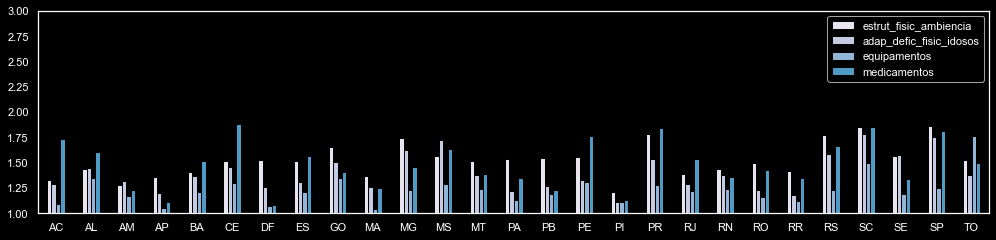

In [27]:
df.groupby(['sig_uf'])[colunas_avaliacao].mean()\
.plot(kind='bar',figsize=(14,3.5),rot=0,edgecolor='black').grid(False)
plt.ylim(1,3)
#plt.title('\nAvaliação média das Unidades Básicas de Saúde por UF\n',fontsize=16,loc='left')
plt.xlabel(None)
plt.tight_layout()
plt.savefig('plots/avaliacao_por_uf.pdf')
plt.show()

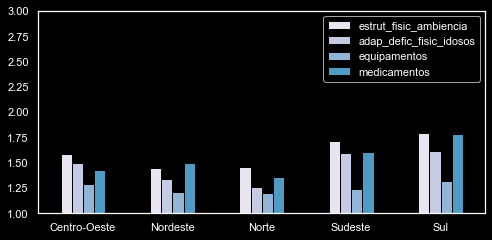

In [28]:
df.groupby(['regiao'])[colunas_avaliacao].mean()\
.plot(kind='bar',figsize=(7,3.5),rot=0,edgecolor='black').grid(False)
plt.ylim(1,3)
#plt.title('\nAvaliação média das Unidades Básicas de Saúde por Região\n',fontsize=13.5,loc='left')
plt.xlabel(None)
plt.tight_layout()
plt.savefig('plots/avaliacao_por_regiao.pdf')
plt.show()

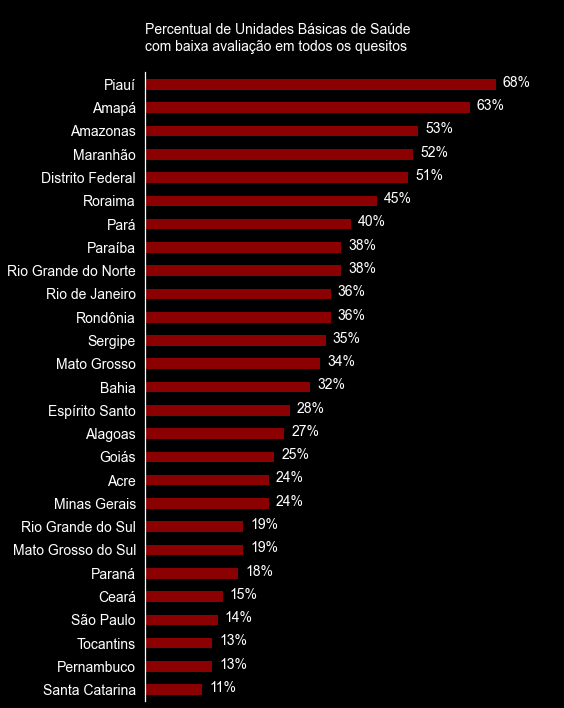

In [29]:
p = (percentual_delicadas.sort_values(ascending=True).round(2) * 100).apply(int)
p = p.plot(kind='barh',figsize=(8,10),color='darkred',edgecolor='black',fontsize=14)

p.spines['right'].set_visible(False)
p.spines['top'].set_visible(False)
p.spines['bottom'].set_visible(False)
p.grid(False)
plt.xlim(0,80)
plt.xticks([])

space_width = max([i.get_width() for i in p.patches])*0.02
for i in p.patches:
    v = str(round((i.get_width()),2)) + '%'
    p.text(i.get_width()+space_width, i.get_y()+.15,v,fontsize=14,color='white')

plt.title('\nPercentual de Unidades Básicas de Saúde\ncom baixa avaliação em todos os quesitos\n',
          loc='left',fontsize=14)
plt.tight_layout()
plt.savefig('plots/percentual_baixa_avaliacao.pdf')
plt.show()


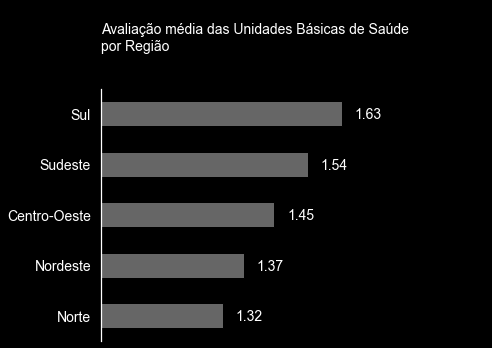

In [30]:
p = df.groupby(['regiao'])[colunas_avaliacao].mean().apply(lambda x: x.mean(),axis=1).round(3).sort_values()
p = p.plot(kind='barh',figsize=(7,5),color='#666666',edgecolor='black',fontsize=14)

p.spines['right'].set_visible(False)
p.spines['top'].set_visible(False)
p.spines['bottom'].set_visible(False)
p.grid(False)
plt.xlim(1,2)
plt.xticks([])
plt.ylabel('')

space_width = max([i.get_width() for i in p.patches])*0.02
for i in p.patches:
    v = str(round((i.get_width()),2))
    p.text(i.get_width()+space_width, i.get_y()+.15,v,fontsize=14,color='white')

plt.title('\nAvaliação média das Unidades Básicas de Saúde\npor Região\n\n',loc='left',fontsize=14)
plt.tight_layout()
plt.savefig('plots/hanking_por_regiao.pdf')
plt.show()

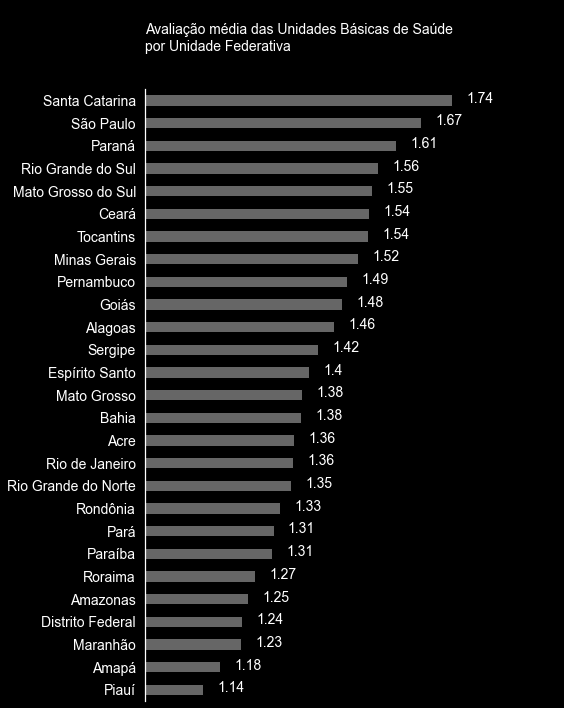

In [31]:
p = avaliacao.apply(lambda x: x.mean(),axis=1).round(3).sort_values()
p = p.plot(kind='barh',figsize=(8,10),color='#666666',edgecolor='black',fontsize=14)

p.spines['right'].set_visible(False)
p.spines['top'].set_visible(False)
p.spines['bottom'].set_visible(False)
p.grid(False)
plt.xlim(1,2)
plt.xticks([])

space_width = max([i.get_width() for i in p.patches])*0.02
for i in p.patches:
    v = str(round((i.get_width()),2))
    p.text(i.get_width()+space_width, i.get_y()+.15,v,fontsize=14,color='white')

plt.title('\nAvaliação média das Unidades Básicas de Saúde\npor Unidade Federativa\n\n',
          loc='left',fontsize=14)
plt.tight_layout()
plt.savefig('plots/hanking_por_uf.pdf')
plt.show()

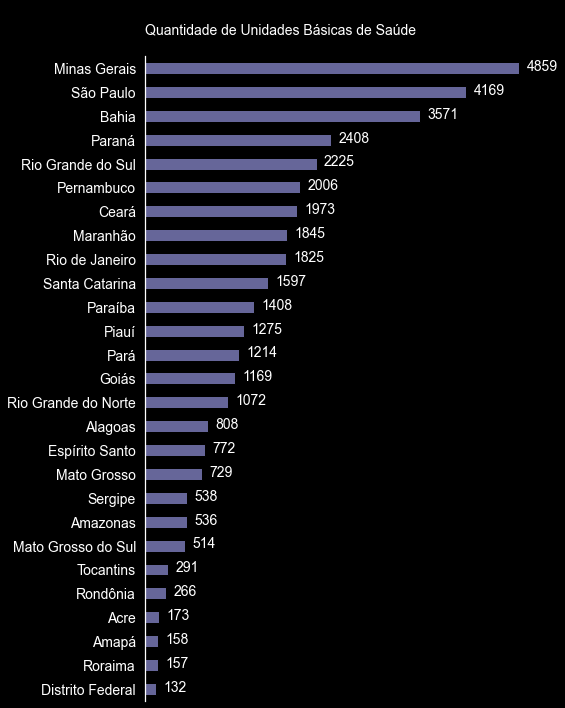

In [32]:
p = df.nome_uf.value_counts(ascending=True)
p = p.plot(kind='barh',figsize=(8,10),color='#666699',edgecolor='black',fontsize=14)

p.spines['right'].set_visible(False)
p.spines['top'].set_visible(False)
p.spines['bottom'].set_visible(False)
p.grid(False)
plt.xlim(0,5000)
plt.xticks([])

space_width = max([i.get_width() for i in p.patches])*0.02
for i in p.patches:
    v = str(round((i.get_width()),2))
    p.text(i.get_width()+space_width, i.get_y()+.15,v,fontsize=14,color='white')

plt.title('\nQuantidade de Unidades Básicas de Saúde\n',
          loc='left',fontsize=14)
plt.tight_layout()
plt.savefig('plots/qtd_ubs.pdf')
plt.show()

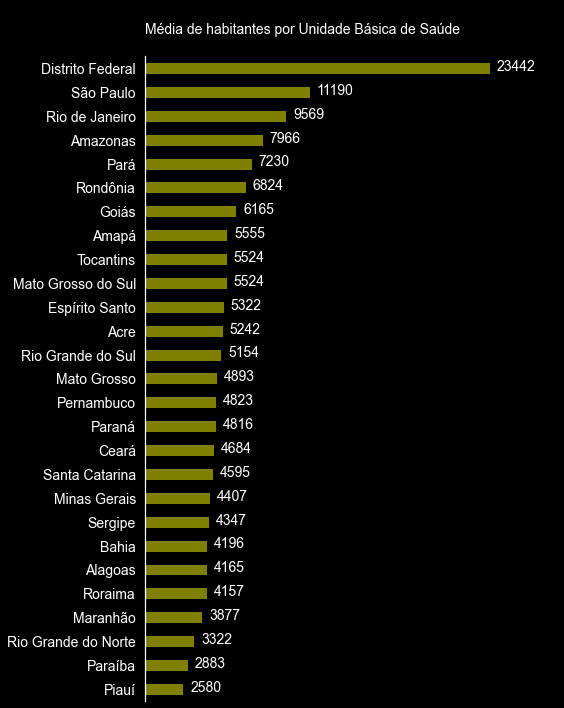

In [33]:
p = (populacao.sort_index()/total.sort_index()).round().apply(int).sort_values()
p = p.plot(kind='barh',figsize=(8,10),color='olive',edgecolor='black',fontsize=14)

p.spines['right'].set_visible(False)
p.spines['top'].set_visible(False)
p.spines['bottom'].set_visible(False)
p.grid(False)
plt.xlim(0,28000)
plt.xticks([])

space_width = max([i.get_width() for i in p.patches])*0.02
for i in p.patches:
    v = str(round((i.get_width()),2))
    p.text(i.get_width()+space_width, i.get_y()+.15,v,fontsize=14,color='white')

plt.title('\nMédia de habitantes por Unidade Básica de Saúde\n',
          loc='left',fontsize=14)
plt.tight_layout()
plt.savefig('plots/habitantes_por_ubs.pdf')
plt.show()

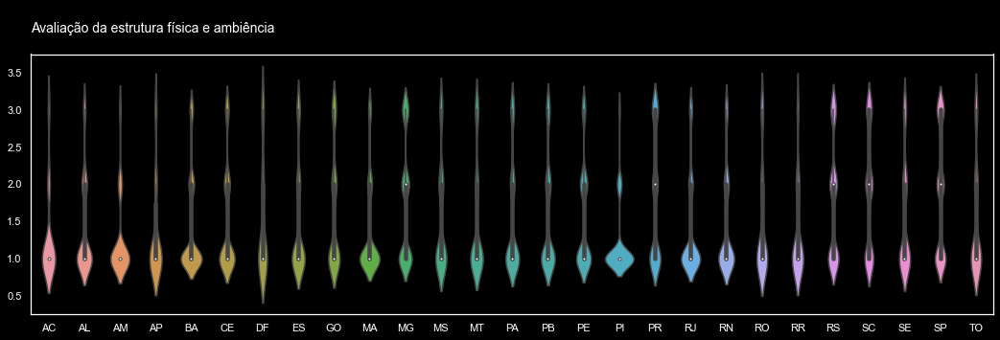

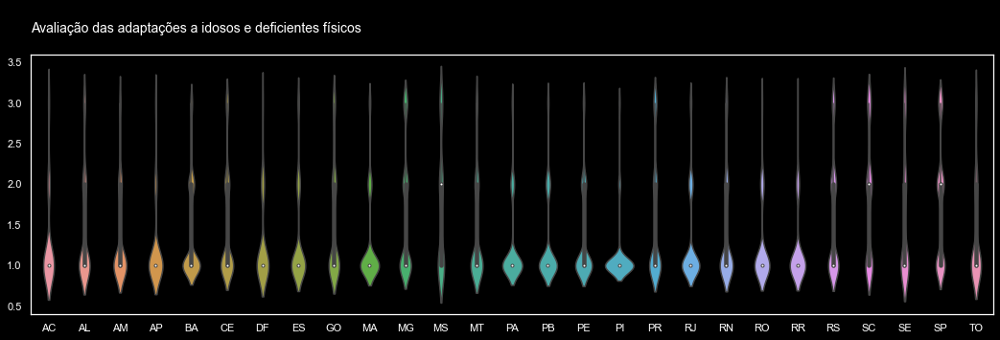

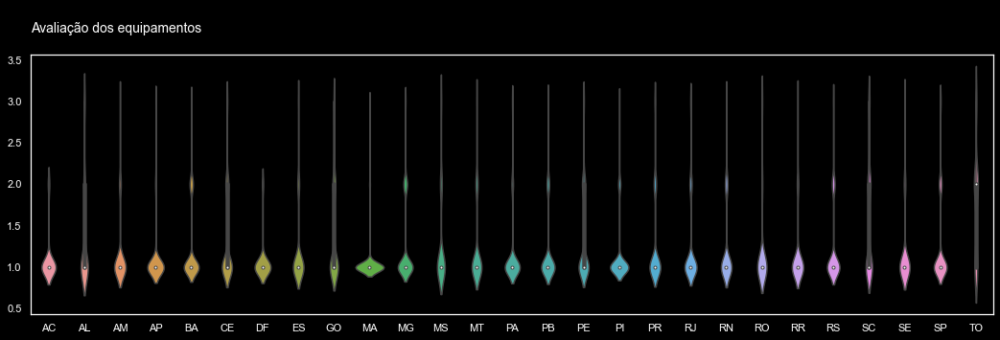

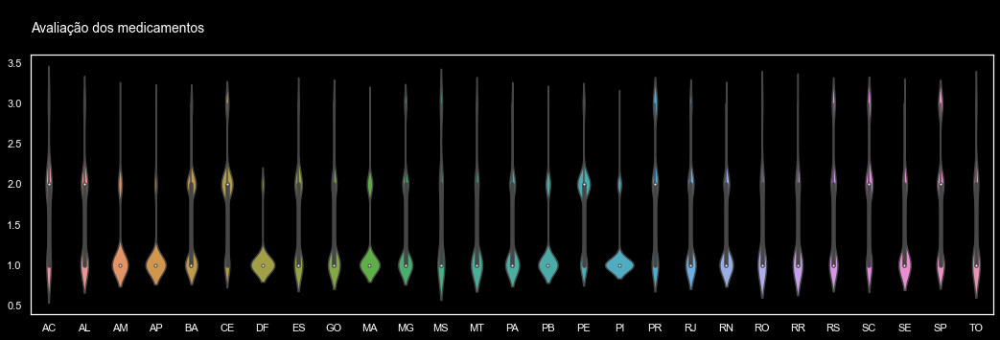

In [34]:
titulos = ['\nAvaliação da estrutura física e ambiência\n',
           '\nAvaliação das adaptações a idosos e deficientes físicos\n',
           '\nAvaliação dos equipamentos\n',
           '\nAvaliação dos medicamentos\n']
for c,titulo in zip(colunas_avaliacao,titulos):
    fig, ax = plt.subplots()
    fig.set_size_inches(18, 5)
    sns.violinplot(y=df[c],x=df.sig_uf,ax=ax,
                   order=df.sig_uf.drop_duplicates().sort_values()).grid(False)
    plt.title(titulo,loc='left',fontsize=14)
    plt.xlabel('')
    plt.ylabel('')
    plt.savefig(f'plots/violinplot_{c}.pdf')
    plt.show()